# Анализ рынка заведений общественного питания Москвы

_____

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

_____
**Цель исследования:**

Помочь инвесторам открыть заведение общественного питания в Москве
    
_____
**Задачи исследования:**

Провести анализ рынка общественного питания Москвы, найти подходящие места и типы заведений

**Исходные данные:**

Файл `moscow_places.csv` хранит сведения о заведениях общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Структура:

- `name` — название заведения;

- `address` — адрес заведения;

- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

- `hours` — информация о днях и часах работы;

- `lat` — широта географической точки, в которой находится заведение;

- `lng` — долгота географической точки, в которой находится заведение;

- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 

«Средний счёт: 1000–1500 ₽»; 

«Цена чашки капучино: 130–220 ₽»; 

«Цена бокала пива: 400–600 ₽». и так далее;

- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

0 — заведение не является сетевым

1 — заведение является сетевым

- `district` — административный район, в котором находится заведение, например Центральный административный округ;

- `seats` — количество посадочных мест.

______

**Данное исследование разделим на несколько частей.**

***Часть 1. Изучение общей информации:***
* [1. Изучение файлов с данными, получение общей информации, загрузка библиотек.](#1-bullet)

***Часть 2. Предобработка данных:***
* [1. Обработка дубликатов и пропусков.](#2-bullet)
* [2. Добавление столбца с названиями улиц.](#4-bullet)
* [3. Добавление столбца с с обозначением, что заведение работает ежедневно и круглосуточно.](#5-bullet)

***Часть 3. Анализ данных:***
* [1. Распределение заведений по категориям.](#6-bullet)
* [2. Количество посадочных мест в местах по категориям.](#7-bullet)
* [3. Соотношение сетевых и несетевых заведений.](#8-bullet)
* [4. Какие категории заведений чаще являются сетевыми.](#9-bullet)
* [5. Топ-15 популярных сетей в Москве.](#10-bullet)
* [6. Распределение заведений по административным районам Москвы.](#11-bullet)
* [7. Распределение средних рейтингов по категориям заведений.](#12-bullet)
* [8. Средний рейтинг заведений каждого района.](#13-bullet)
* [9. Карта заведений Москвы.](#14-bullet)
* [10. Топ-15 улиц по количеству заведений.](#15-bullet)
* [11. Улицы с одним объектом общепита.](#16-bullet)
* [12. Влияние удалённости от центра на цены в заведениях.](#17-bullet)
* [13. Зависимость часов работы заведений от их расположения и категории заведения.](#18-bullet)
* [14. Особенности заведений с плохими рейтингами.](#19-bullet)

***Часть 4. Детализируем исследование: открытие кофейни:***
* [1. Количенство кофеен по районам.](#20-bullet)
* [2. Круглосуточные кофейни.](#21-bullet)
* [3. Распределение рейтингов кофеен по районам.](#22-bullet)
* [4. Стоимость чашки капучино.](#23-bullet)

***Часть 5. Общий вывод:***
* [1. Вывод.](#24-bullet)

## Изучение общей информации

### Изучение файлов с данными, получение общей информации, загрузка библиотек

<a id="1-bullet"></a>

In [1]:
#импортируем библиотеки 
import pandas as pd
import datetime as dt
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
import warnings

warnings.filterwarnings("ignore")

In [2]:
#читаем csv файл
path = '/Users/denisbotvinovskii/Documents/bootcamp/project15/'

try:
    data = pd.read_csv(path + 'moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
#Выводим общую информацию о датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
#Выводим первые 5 строчек датафрейма
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
#Проверим более детальную информацию о данных
data.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,8406.0,55.750109,0.069658,55.573942,55.705155,55.753425,55.795041,55.928943
lng,8406.0,37.608570,0.098597,37.355651,37.538583,37.605246,37.664792,37.874466
rating,8406.0,4.229895,0.470348,1.000000,4.100000,4.300000,4.400000,5.000000
middle_avg_bill,3149.0,958.053668,1009.732845,0.000000,375.000000,750.000000,1250.000000,35000.000000
middle_coffee_cup,535.0,174.721495,88.951103,60.000000,124.500000,169.000000,225.000000,1568.000000
chain,8406.0,0.381275,0.485729,0.000000,0.000000,0.000000,1.000000,1.000000
seats,4795.0,108.421689,122.833396,0.000000,40.000000,75.000000,140.000000,1288.000000


**Вывод:**
Изучили общую информацию о данных

- Представлено 8406 заведений;
- Датафрейм включает в себя 14 столбцов;
- Наличие пропусков в данных в столбах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`;
- По детальным данным сразу заметны выбивающиеся значения максимумов у `middle_avg_bill`, `middle_coffee_cup` и `seats`.

Типы данных представлены корректно, в изменении не нуждаются:

- object (`name`, `category`, `address`, `district`, `hours`, `price`, `avg_bill`)
- float64 (`lat`, `lng`, `rating`, `middle_avg_bill`, `middle_coffee_cup`, `seats`)
- int64 (`chain`)

## Предобработка данных

### Обработка дубликатов и пропусков

<a id="2-bullet"></a>

In [6]:
#Посмотрим, есть ли в датафрейме явные дубликаты, используем методы duplicated() и sum()
data.duplicated().sum()

0

In [7]:
#Найдем неявные дубликаты по широте и долготе
data.duplicated(subset=['lat', 'lng']).sum()

34

In [8]:
#Найдем конкретные строки с дубликатами
data.duplicated(subset=['lat', 'lng'])

0       False
1       False
2       False
3       False
4       False
        ...  
8401     True
8402    False
8403    False
8404    False
8405    False
Length: 8406, dtype: bool

In [9]:
#проверим строку под номером 8401 найдем ее широту и долготу 
data.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


In [10]:
#теперь выведем только те строки, которые соотвествуют нужным параметрам
data.query('lat == 55.670021 and lng == 37.552480')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7066,Кофе,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.670021,37.55248,5.0,NaN,NaN,NaN,NaN,1,86.0
7076,Южная Ночь,быстрое питание,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 12:00–23:00",55.670021,37.55248,4.2,выше среднего,Средний счёт:1200 ₽,1200.0,NaN,0,86.0
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.55248,4.4,NaN,NaN,NaN,NaN,0,86.0


Как мы видим ошибки нет, соответсвенно дубликаты отсутствуют

Теперь рассмотрим пропуски в данных

In [11]:
#Посчитаем количество пропусков
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В найденных пропусках мы не можем сделать замену на какие-либо численные значения медианы или среднего, так как нет соответствующих данных, а заполенение нулями численных значений повлияют на их анализ. Единственное, мы можем заменить пропуски в столбцах с типом данных object на `unknown`, чтобы это не мешало дальнейшему исследованию.

In [12]:
#Заменим пропуски во всем датафрейме с помощью метода fillna()
data[['hours', 'price', 'avg_bill']] = data[['hours', 'price', 'avg_bill']].fillna('unknown')

**Вывод:**

В нашем датафрейме нет дубликатов, но присутствуют пропуски. Мы обработали пропуски в столбцах с типом данных object и заменили их на `unknown`.

### Добавление столбца с названиями улиц
<a id="4-bullet"></a>

Необходимо создать столбец с названием улицы `street`, возьмем это значение из столбца с адресом `address`. 

In [13]:
#Для вычленения улицы разделим строку на части, воспользуемся методом str.split() и возьмем второе значение по индексу 
data['street'] = data['address'].str.split(',').str[1]

**Вывод:**

Создали стоблцей с названием улицы

### Добавление столбца с с обозначением, что заведение работает ежедневно и круглосуточно
<a id="5-bullet"></a>

Сначала необходимо исследовать значения в столбце с графиком работы `hours`

In [14]:
#выведем значения в стобце hours, где присутствует слово 'ежедневно', так как часы работы могут быть указаны по-разному
#воспользуемся методом str.contains() и с помощью value_counts() выведем уникальные значения с их количеством
data[data['hours'].str.contains(r'\bежедневно')]['hours'].value_counts().head(10)

ежедневно, 10:00–22:00      759
ежедневно, круглосуточно    730
ежедневно, 11:00–23:00      396
ежедневно, 10:00–23:00      310
ежедневно, 12:00–00:00      254
ежедневно, 09:00–21:00      204
ежедневно, 09:00–22:00      184
ежедневно, 12:00–23:00      178
ежедневно, 08:00–23:00      160
ежедневно, 08:00–22:00      148
Name: hours, dtype: int64

Исходя из найденных показателей мы видим, что нашим требованиям соответствует только одно значение - `ежедневно, круглосуточно`. Поэтому столбец с булевым типом данных мы будем создавать только на основе сравнения значений в столбце `hours` и строке `ежедневно, круглосуточно`.

In [15]:
data['is_24/7'] = data['hours'] == "ежедневно, круглосуточно"

In [16]:
#Выведем полученный датафрейм
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Вывод по разделу:**

Изучили наш датафрейм на наличие дубликатов и пропусков:

- дубликаты отсутствуют 
- пропуски присутстсуют, обработали пропуски в столбцах с типом данных object значением `unknown`

Также создали новые столбцы:

- столбец с названием улицы `street`
- столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7): логическое значение True — если заведение работает ежедневно и круглосуточно; логическое значение False — в противоположном случае.

## Анализ данных

### Распределение заведений по категориям
<a id="6-bullet"></a>

In [17]:
# группируем данные по категориям и подсчитваем количество, также отсротируем по убыванию
data_category = data.pivot_table(index='category', values='address', aggfunc='count').reset_index()\
.sort_values('address', ascending=False)

data_category

,category,address
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


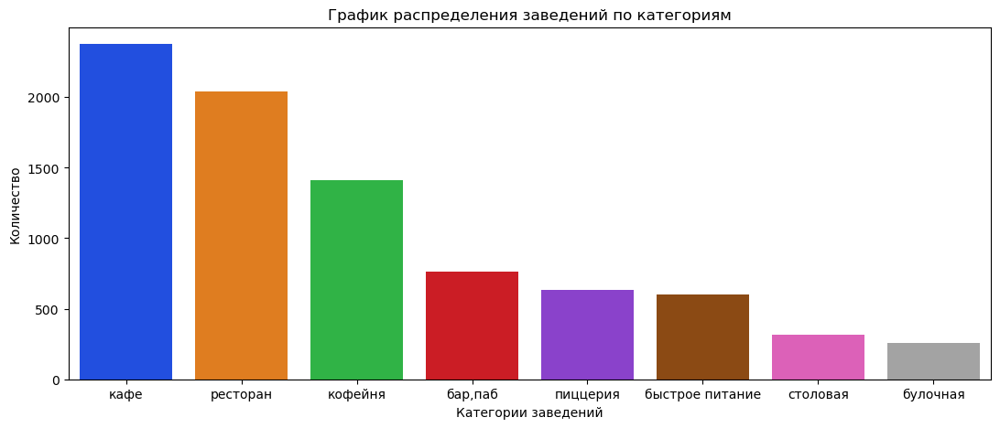

In [18]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_category, x='category', y='address', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения заведений по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество');

**Вывод:**

По полученному графику видно, что самые распространенны заведения в Москве - это кафе, а также большое количество ресторанов и кофеен. Меньше всего - столовых и булочных.

### Количество посадочных мест в местах по категориям
<a id="7-bullet"></a>

In [19]:
# группируем данные по категориям и подсчитваем медианное количество посадочных мест, также отсротируем по убыванию
data_seats = data.pivot_table(index='category', values='seats', aggfunc='median').reset_index()\
.sort_values('seats', ascending=False)

data_seats

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


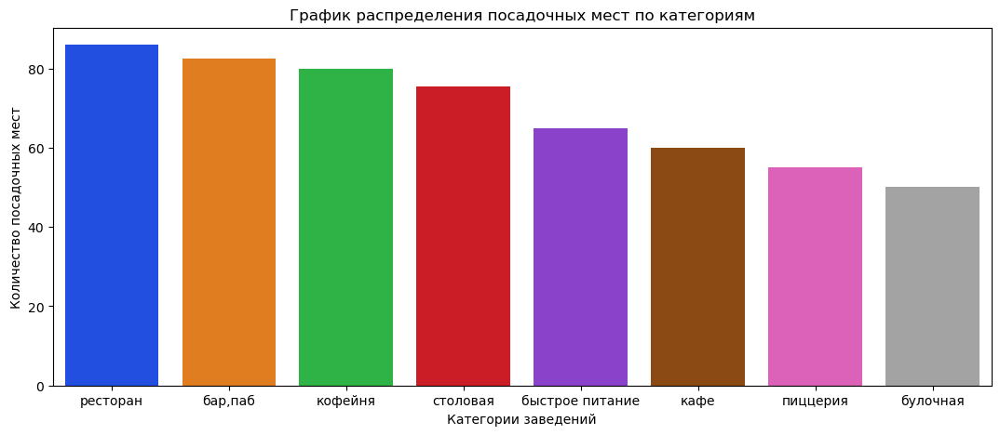

In [20]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_seats, x='category', y='seats', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения посадочных мест по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест');

**Вывод:**

По полученному графику видно, что наибольшее количество посадочных мест представлены в ресторанах, барах/пабах и кофейнях. Меньше всего - в пиццериях и булочных. Это обусловлено тем, что в последних упомянутых заведелениях часто берут еду на вынос.

### Соотношение сетевых и несетевых заведений
<a id="8-bullet"></a>

In [21]:
# группируем данные по показателю сетевых заведений и подсчитваем количество, также отсротируем по убыванию
data_chain = data.pivot_table(index='chain', values='address', aggfunc='count').reset_index()\
.sort_values('address', ascending=False)

#Заменим значения в столбце chain 0 - несетевое, 1 - сетевое для наглядности
data_chain = data_chain.replace([0, 1],['несетевое','сетевое'])
data_chain

,chain,address
0,несетевое,5201
1,сетевое,3205


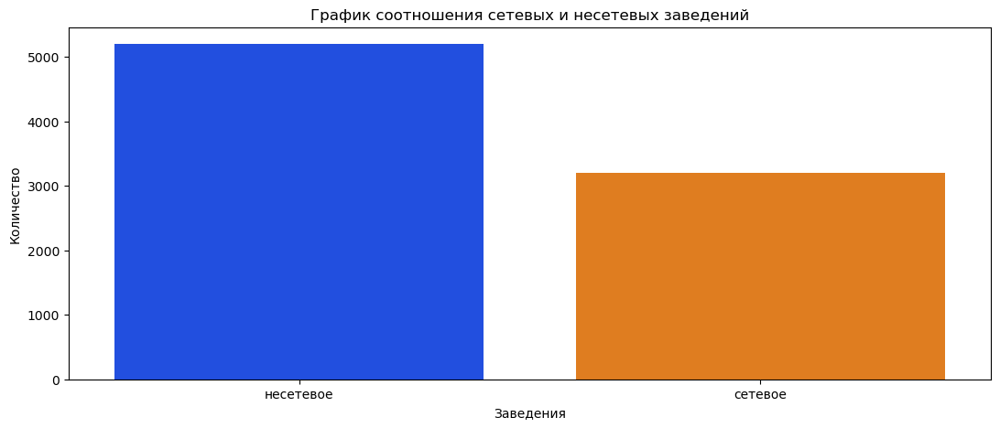

In [22]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_chain, x='chain', y='address', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График соотношения сетевых и несетевых заведений')
plt.xlabel('Заведения')
plt.ylabel('Количество');

**Вывод:**

По полученному графику видно, что несетевых заведений примерно в полтора раза больше, чем сетевых. 

### Какие категории заведений чаще являются сетевыми
<a id="9-bullet"></a>

In [23]:
# группируем данные по категориям и показателю сетевых заведений и подсчитваем количество, 
# также отсротируем по убыванию
data_c = data.groupby(['category', 'chain'], as_index=False)[['address']].count()\
.sort_values(['address','category'], ascending=False)

#Заменим значения в столбце chain 0 - несетевое, 1 - сетевое для наглядности
data_c = data_c.replace([0, 1],['несетевое','сетевое'])

data_c

,category,chain,address
6,кафе,несетевое,1599
12,ресторан,несетевое,1313
7,кафе,сетевое,779
13,ресторан,сетевое,730
9,кофейня,сетевое,720
8,кофейня,несетевое,693
0,"бар,паб",несетевое,596
4,быстрое питание,несетевое,371
11,пиццерия,сетевое,330
10,пиццерия,несетевое,303


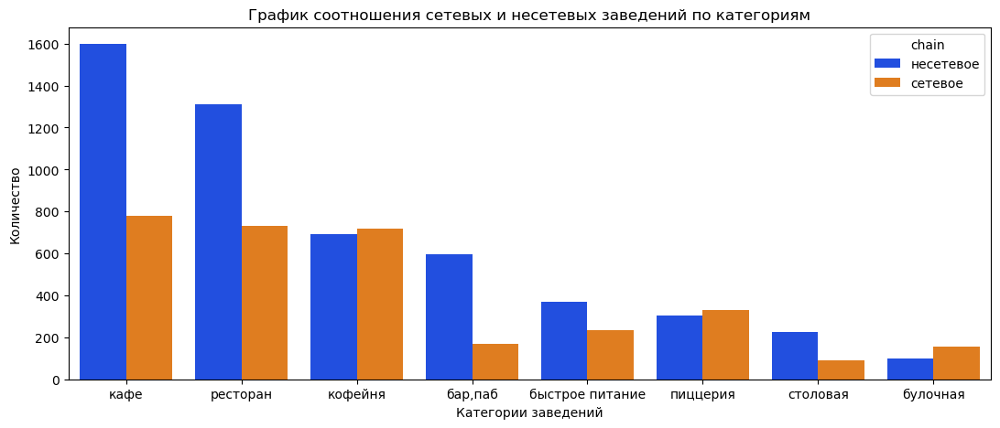

In [24]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_c, x='category', y='address', hue='chain', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График соотношения сетевых и несетевых заведений по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество');

**Вывод:**

По полученному графику видно, что сетевыми заведениями чаще являются такие категории, как кофейни, пиццерии, булочные, хотя соотношение количества между сетевыми и несетевыми у них примерно одинаковое. Для остальных же категорий преобладают несетевые.

### Топ-15 популярных сетей в Москве
<a id="10-bullet"></a>

Для выявления топ-15 популярных заведений сначала сгруппируем данные по названиям 

In [25]:
# группируем данные по названиям и считаем их количество, также отсротируем по убыванию и оставляем только первые 15

data.groupby('name', as_index=False)[['address']].count().sort_values('address', ascending=False).head(15)

,name,address
2890,Кафе,189
5522,Шоколадница,120
2584,Домино'с Пицца,76
2551,Додо Пицца,74
1156,One Price Coffee,71
5595,Яндекс Лавка,69
419,Cofix,65
1290,Prime,50
5083,Хинкальная,44
5421,Шаурма,43


В найденных названиях есть несколько заведений, которые вызывают сомнения, как сетевое предприятие, так как название обобщенное, проверим являются ли они сетевыми по столбцу `chain`, разберем на примере `Кафе`

In [26]:
# Выведем первые строки отфильрованного по названию Кафе 
data.query('name == "Кафе"').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,unknown,55.895115,37.524902,3.7,unknown,unknown,NaN,NaN,0,NaN,Ижорская улица,False
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,unknown,unknown,NaN,NaN,0,35.0,улица Маршала Федоренко,False
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,unknown,55.908930,37.558777,4.2,unknown,unknown,NaN,NaN,0,NaN,МКАД,False
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,unknown,55.897794,37.591395,4.3,unknown,unknown,NaN,NaN,0,50.0,Шенкурский проезд,False
141,Кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,unknown,unknown,NaN,NaN,0,70.0,Дубнинская улица,False


Как видно из данных заведения с названием `Кафе` не являются сетевыми, в столбце `chain` значение 0, поэтому топ-15 популярных заведений будем выбирать только из сетевых. Для этого отфильруем наш датафрейм.

In [27]:
data_group = data.query('chain == 1')

In [28]:
# Теперь снова группируем отфильтрованные данные по названиям и считаем их количество, также отсротируем по убыванию 
#и оставляем только первые 15

data_group.groupby('name', as_index=False)[['address']].count()\
.sort_values('address', ascending=False).head(15)

,name,address
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


При изучении полученного списка заведений можно заметить `Яндекс Лавка` - это сервис доставки еды. Поэтому исключаем его из рассмотрения. 

In [29]:
#Создаем новый датафрейм, где исключаем Яндекс Лавку

data_name = data_group.query('name != "Яндекс Лавка"').groupby('name', as_index=False)[['address']].count()\
.sort_values('address', ascending=False).head(15)

data_name

,name,address
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39
643,Теремок,38


Далее нам необходимо рассмотреть к каким категориям относятся популярные сети

In [30]:
#Для начала сформируем датафрейм из названий и их категорий

data_cat = data[['name', 'category']]
data_cat

,name,category
0,WoWфли,кафе
1,Четыре комнаты,ресторан
2,Хазри,кафе
3,Dormouse Coffee Shop,кофейня
4,Иль Марко,пиццерия
...,...,...
8401,Суши Мания,кафе
8402,Миславнес,кафе
8403,Самовар,кафе
8404,Чайхана Sabr,кафе


In [31]:
#Объединим датафрейм с попурялными сетями заведений и датафреймом с категориями, используем метод merge()

data_name_a = data_name.merge(data_cat)
data_name_a

,name,address,category
0,Шоколадница,120,кофейня
1,Шоколадница,120,кофейня
2,Шоколадница,120,кофейня
3,Шоколадница,120,кофейня
4,Шоколадница,120,кофейня
...,...,...,...
766,Drive Café,24,кафе
767,Drive Café,24,кафе
768,Drive Café,24,кафе
769,Drive Café,24,кафе


Как видно из результата, некоторым названиям соответствуют несколько категорий. Возможно в сервисе Яндекс Бизнес пользователи самостоятельно вводили категории заведений и невсегда корректно. Нам необходимо найти настоящую категорию, будем это делать исходя из самой популярной категории заведения. 

In [32]:
#Создаем цикл, где будем перебирать каждое уникальное название из датасета data_name['name'] 
#и выводить количество категорий заведения

for n in data_name['name'].unique():
    print(data_name_a.query('name == @n').value_counts())

name         address  category
Шоколадница  120      кофейня     119
                      кафе          1
dtype: int64
name            address  category
Домино'с Пицца  76       пиццерия    76
dtype: int64
name        address  category
Додо Пицца  74       пиццерия    74
dtype: int64
name              address  category
One Price Coffee  71       кофейня     71
dtype: int64
name   address  category
Cofix  65       кофейня     65
dtype: int64
name   address  category
Prime  50       ресторан    49
                кафе         1
dtype: int64
name        address  category       
Хинкальная  44       кафе               19
                     ресторан           15
                     быстрое питание     6
                     бар,паб             3
                     столовая            1
dtype: int64
name      address  category
КОФЕПОРТ  42       кофейня     42
dtype: int64
name                                 address  category
Кулинарная лавка братьев Караваевых  39       кафе        3

Из полученных данных возмем самые популярные категории заведений и присвоим их названиям. Для этого создаем новый датафрейм с двумя столбцами: название и категории, где категории пропишем вручную, а названия возьмем из `data_name['name']`

In [33]:
data_category_unique = pd.DataFrame({'name': data_name['name'].unique(),
                                    'category':['кофейня', 
                                                'пиццерия', 
                                                'пиццерия', 
                                                'кофейня', 
                                                'кофейня', 
                                                'ресторан', 
                                                'кафе', 
                                                'кофейня', 
                                                'кафе', 
                                                'ресторан', 
                                                'кафе', 
                                                'кофейня', 
                                                'булочная', 
                                                'кафе', 
                                                'кафе']})

data_category_unique

,name,category
0,Шоколадница,кофейня
1,Домино'с Пицца,пиццерия
2,Додо Пицца,пиццерия
3,One Price Coffee,кофейня
4,Cofix,кофейня
5,Prime,ресторан
6,Хинкальная,кафе
7,КОФЕПОРТ,кофейня
8,Кулинарная лавка братьев Караваевых,кафе
9,Теремок,ресторан


Теперь соединим полученные данные и датафрейм с названиями и количеством

In [34]:
#Для объединения используем метод merge()

data_name_unique = data_category_unique.merge(data_name)
data_name_unique

,name,category,address
0,Шоколадница,кофейня,120
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Cofix,кофейня,65
5,Prime,ресторан,50
6,Хинкальная,кафе,44
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,38


Мы собрали необходимые данные и можем построить графики

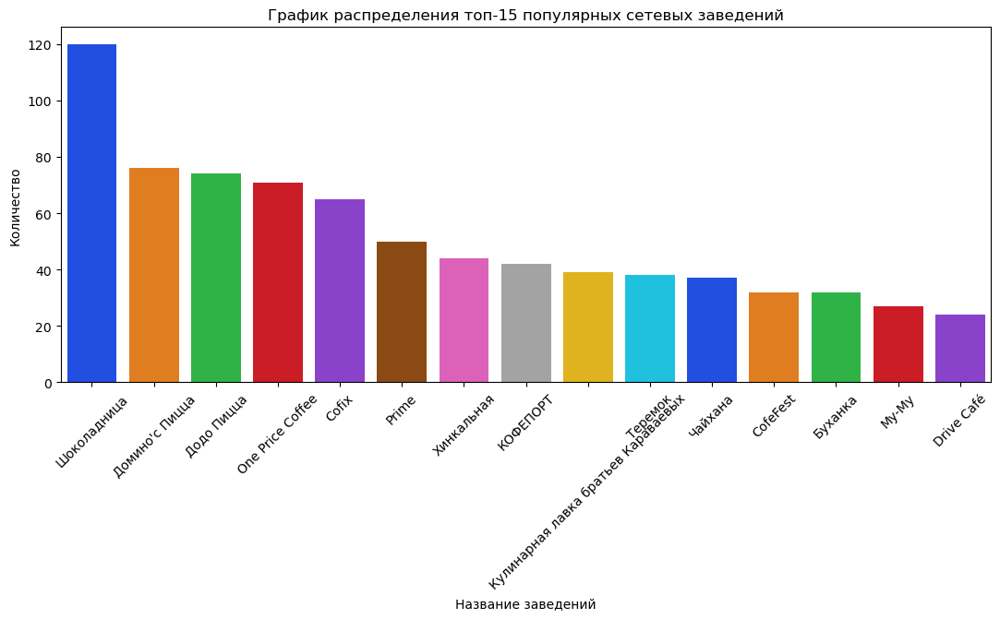

In [35]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_name_unique, x='name', y='address', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения топ-15 популярных сетевых заведений')
plt.xlabel('Название заведений')
plt.ylabel('Количество')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

Рассмотрим категории, в которых представлены популярные заведения

In [36]:
#Сгруппируем наш датафрейм data_name_unique по категориям и считаем их количество, также отсротируем по убыванию

cnt_category = data_name_unique.groupby('category', as_index=False)['name'].count()\
.sort_values('name', ascending=False)

cnt_category

,category,name
1,кафе,5
2,кофейня,5
3,пиццерия,2
4,ресторан,2
0,булочная,1


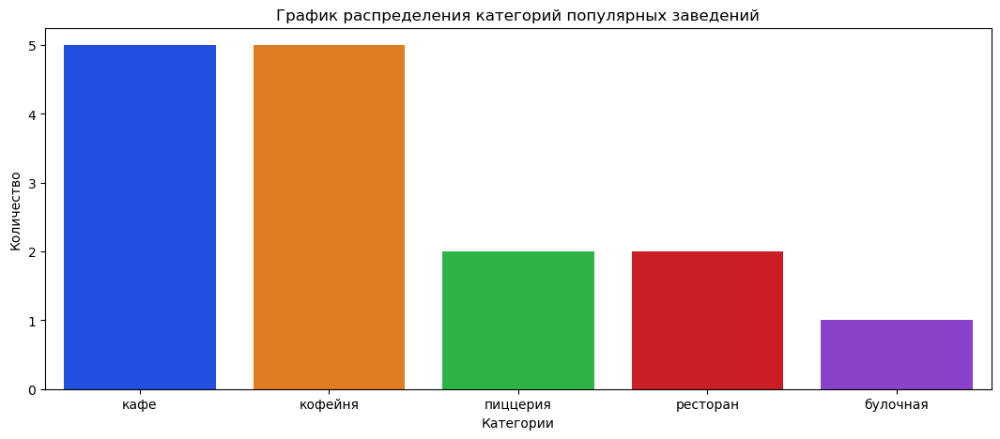

In [37]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=cnt_category, x='category', y='name', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения категорий популярных заведений')
plt.xlabel('Категории')
plt.ylabel('Количество');

**Вывод:**

По полученным данным можно сказать, что самое популярное заведение Москвы - это `Шоколадница`, она лидирует с большим отрывом, также в топ-15 популярных сетей вошли заведения: 

- Домино'с Пицца, 
- Додо Пицца, 
- One Price Coffee,
- Cofix, 
- Prime, 
- Хинкальная, 
- КОФЕПОРТ,
- Кулинарная лавка братьев Караваевых, 
- Теремок, 
- Чайхана,
- CofeFest, 
- Буханка, 
- Му-Му, 
- Drive Café.

Категории, в которых представлены популярные заведения:
- кафе,
- кофейня,
- пиццерия,
- ресторан,
- булочная. 

Наимбольшей популярностью пользуются кафе и кофейни.

### Распределение заведений по административным районам Москвы
<a id="11-bullet"></a>

Изучим какие административные районы Москвы присутствуют в наших данных

In [38]:
#посмотрим на количесвто заведений по административным округам
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [39]:
#теперь найдем как распределены заведения в округах по категориям
data_district = data.groupby(['district', 'category'], as_index=False)[['name']].count()\
.sort_values(['name', 'district'], ascending=False)

data_district

,district,category,name
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [40]:
# строим столбчатый график с помощью plotly по созданному датафрейму
fig = px.bar(data_district, x='name', y='district', color='category',
    labels={'category':'Категория'},
    width=1000, height=600,
    title='График распределения заведений по административным округам и категориям')

# отсортируем график по убыванию
fig.update_yaxes(categoryorder='total ascending')
# оформляем график
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Административный округ')
fig.show() 

**Вывод:**

В наших данных присутствуют 9 административных округов Москвы:

- Центральный административный округ         
- Северный административный округ            
- Южный административный округ               
- Северо-Восточный административный округ     
- Западный административный округ             
- Восточный административный округ            
- Юго-Восточный административный округ        
- Юго-Западный административный округ         
- Северо-Западный административный округ      

Наибольшее количество заведений расположено в Центральном административном округе, в котором преобладают рестораны, а также кафе и кафейни, чуть меньше бары/пабы. В остальных округах распространены кафе и в меньшей степени рестораны.

### Распределение средних рейтингов по категориям заведений
<a id="12-bullet"></a>

Для исследования средних рейтингов по категориям заведений сгруппируем данные и найдем медианное значение

In [41]:
#сгруппируем данные 
data_rating = data.groupby('category', as_index=False)[['rating']].median()\
.sort_values('rating', ascending=False)

data_rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


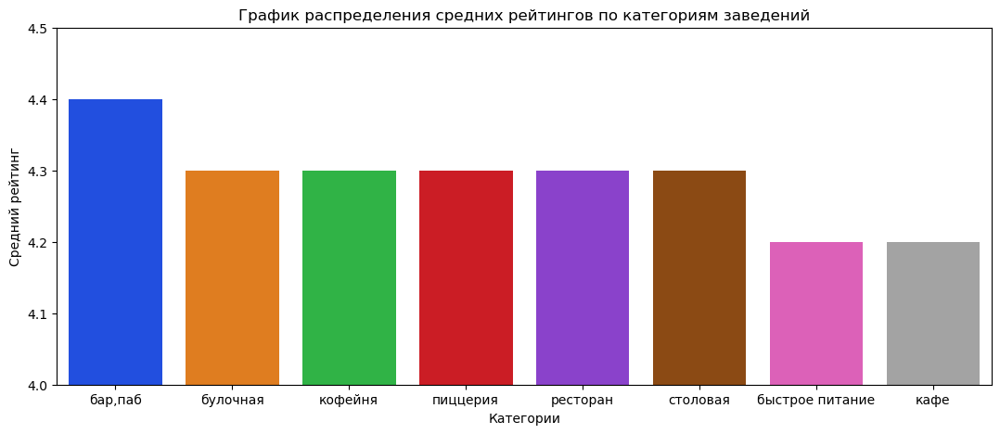

In [42]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_rating, x='category', y='rating', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения средних рейтингов по категориям заведений')
plt.xlabel('Категории')
plt.ylabel('Средний рейтинг')

# задаем пределы по оси Y для наглядности
plt.ylim(4, 4.5);

**Вывод:**

По полученным данным видно, что усреднённые рейтинги в разных типах общепита не сильно различаются. Значения находятся в диапозоне от 4 до 4.4. Наибольший рейтинг у баров/пабов, наименьший - быстрое питание и кафе.

### Средний рейтинг заведений каждого района
<a id="13-bullet"></a>

Для построения фоновой картограммы (хороплета) с медианным рейтингом заведений каждого района сначала сформируем датафрейм по окургам и медианным рейтингам.

In [43]:
#сгруппируем данные 
data_rating_distr = data.groupby('district', as_index=False)[['rating']].median()\
.sort_values('rating', ascending=False).round(2)

data_rating_distr

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [44]:
# читаем файл и сохраняем в переменной
with open(path + 'admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [45]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating_distr,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.6,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:**

По карте видно, что наибольший рейтинг у Центрального административного округа, у остальных округов медианный рейтинг одинаковый, наименьший - у Северо-Восточного административного округа и Юго-Восточного административного округа.

### Карта заведений Москвы
<a id="14-bullet"></a>

Отобразим все заведения датафрейма на карте с помощью кластеров средствами библиотеки folium.

In [47]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:**

Построили карту распределения заведений по Москве, по которой видно, что количество заведений при удалении от центра уменьшается.

### Топ-15 улиц по количеству заведений
<a id="15-bullet"></a>

Для нахождения топ-15 улиц по количеству заведений создадим новый датафрейм при помощи группировки по названиям улиц.

In [48]:
#группируем по street, считаем количество, сортируем по убыванию и оставляем первые 15
data_street = data.groupby('street', as_index=False)[['name']].count().sort_values('name', ascending=False).head(15)

data_street

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [49]:
#Дополнительно найдем какой процент составляет количество заведений на улицах от общего количества 
data_street['perc'] = round(data_street['name'] / data.shape[0] * 100, 2)

data_street

,street,name,perc
1090,проспект Мира,184,2.19
773,Профсоюзная улица,122,1.45
1087,проспект Вернадского,108,1.28
525,Ленинский проспект,107,1.27
523,Ленинградский проспект,95,1.13
373,Дмитровское шоссе,88,1.05
455,Каширское шоссе,77,0.92
298,Варшавское шоссе,76,0.90
524,Ленинградское шоссе,70,0.83
550,МКАД,65,0.77


Далее необходимо сгруппировать данные по улицам и категориям, чтобы дополнительно рассмотреть количество заведений по категориям.

In [50]:
data_street_cat = data.groupby(['street', 'category'], as_index=False)[['name']].count()\
.sort_values('name', ascending=False)

Теперь оставим данные только по самым популярным улицам из выше созданного датафрейма

In [51]:
#отфильтруем с помощью isin()
data_street_category = data_street_cat[data_street_cat['street'].isin(data_street['street'])]

data_street_category

,street,category,name
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
2843,проспект Вернадского,булочная,1
1365,Люблинская улица,пиццерия,1
1378,МКАД,"бар,паб",1
1383,МКАД,столовая,1


In [52]:
# строим столбчатый график с помощью plotly по созданному датафрейму
fig = px.bar(data_street_category, x='street', y='name', color='category',
    labels={'category':'Категория'},
    width=1000, height=600,
    title='График распределения заведений по улицам и категориям')

# отсортируем график 
fig.update_xaxes(categoryorder='total ascending')

# оформляем график
fig.update_layout(xaxis_title='Названия улиц',
                  yaxis_title='Количество заведений')
fig.show() 

**Вывод:**

В топ-15 улиц по количеству заведений вошли следующие улицы в соответствующем порядке с указанием процента от общего числа:

- проспект Мира	- 2.19%
- Профсоюзная улица	- 1.45%
- проспект Вернадского - 1.28%	
- Ленинский проспект - 1.27%	
- Ленинградский проспект - 1.13%	
- Дмитровское шоссе - 1.05%	
- Каширское шоссе - 0.92%	
- Варшавское шоссе - 0.90%
- Ленинградское шоссе - 0.83%	
- МКАД - 0.77%	
- Люблинская улица - 0.71%	
- улица Вавилова - 0.65%	
- Кутузовский проспект - 0.64%
- улица Миклухо-Маклая - 0.58%	
- Пятницкая улица - 0.57%	

На проспекте Мира преобладают кафе, а также рестораны и кафейни, на остальных улицах популярными категориями заведений являются кафе и рестораны, их пропорции немного варьируются.

### Улицы с одним объектом общепита
<a id="16-bullet"></a>

Найдем улицы, на которых находится только один объект общепита, для этого сгруппируем данные по улицам, посчитаем количество заведений и методом query() выберем только те, где кол-во равно 1.

In [53]:
str_min =  data.groupby('street', as_index=False)[['name']].count().query('name == 1')

In [54]:
#отфильтруем наш датафрем по улицам с одним заведением с помощью isin()
street_min = data[data['street'].isin(str_min['street'])]

street_min.shape[0]

458

Теперь найдем общее в найденных улицах, для начала проанализируем категории и являются ли они сетевыми.

In [55]:
street_df = street_min.groupby(['category', 'chain'], as_index=False)[['name']].count().\
sort_values(['name', 'category'], ascending=False)

street_df

,category,chain,name
6,кафе,0,117
12,ресторан,0,71
8,кофейня,0,52
7,кафе,1,43
0,"бар,паб",0,33
9,кофейня,1,32
14,столовая,0,27
13,ресторан,1,22
4,быстрое питание,0,15
15,столовая,1,9


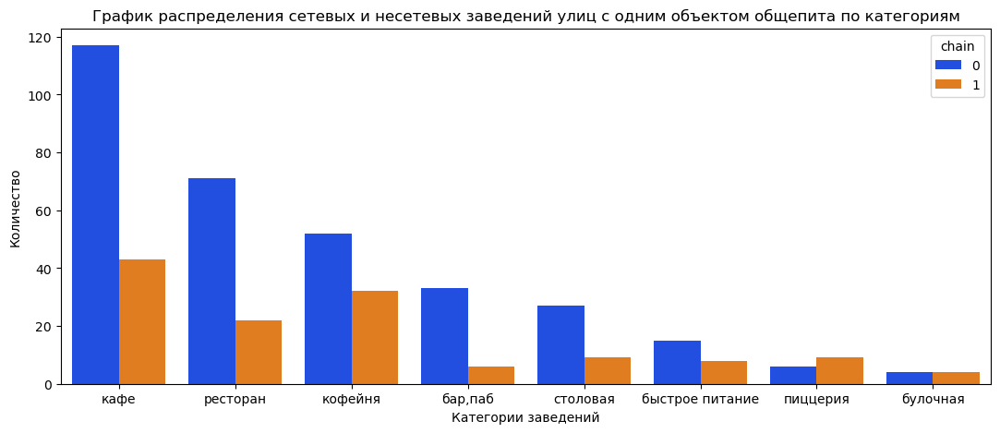

In [56]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=street_df, x='category', y='name', hue='chain', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения сетевых и несетевых заведений улиц с одним объектом общепита по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество');

Теперь рассмотрим рейтинги заведений

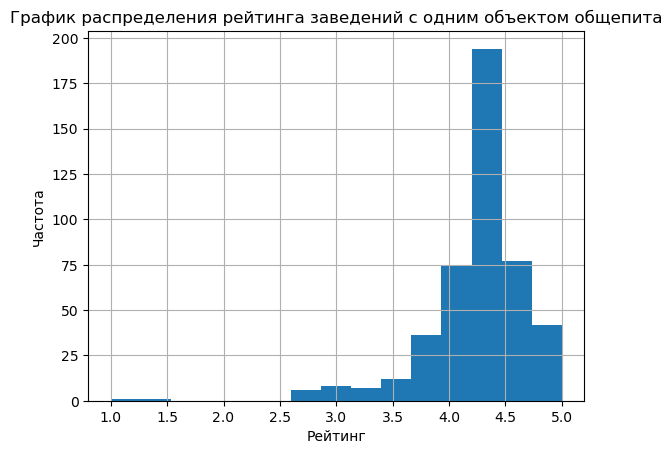

In [57]:
#Построим гистограмму по рейтину из созданного датафрейма
street_min.hist('rating', bins = 15)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения рейтинга заведений с одним объектом общепита')
plt.xlabel('Рейтинг')
plt.ylabel('Частота');

**Вывод:**

Количество улиц с одним объектом общепита - 458. Большинство заведений представлены в категориях кафе, ресторан и кофейни, также преобладают несетевые заведения. В основном, рейтинг заведений распределены от 4.0 до 4.7.

### Влияние удалённости от центра на цены в заведениях
<a id="17-bullet"></a>

Проанализируем средние чеки заведений по административным округам Москвы.

Для этого сгруппируем датафрейм по округам и найдем медианное значение средних чеков заведений.

In [58]:
data_middle = data.groupby('district', as_index=False)[['middle_avg_bill']].median()\
.sort_values('middle_avg_bill', ascending=False)

data_middle 

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [59]:
# создаём карту Москвы
mos = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_middle,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианные средние чеки заведений по районам',
).add_to(mos)

# выводим карту
mos

**Вывод:**

По построенной фоновой картограмме видно, что есть зависимость средних чеков заведений и удаленности от центра Москвы. Чем дальше от центра, тем ниже значения среднего чека. Наибольший средний чек в Центральном и Западном административных округах, наименьший - у Северо-Восточного, Южного и Юго-Восточного административных округов.

### Зависимость часов работы заведений от их расположения и категории заведения
<a id="18-bullet"></a>

Проанализируем зависимость часов работы заведений от расположения и категории заведения. Для этого будем рассматривать столбец с круглосуточными показателями `is_24/7`.

In [60]:
#Сначала переведем булевые значения в числовые
data['is_24/7'] = data['is_24/7'].astype('int')

In [61]:
#сгруппируем данные по округам и категориям посчтаем кол-во круглосуточных заведений
data_hours = data.groupby(['district', 'category'], as_index=False)[['is_24/7']].sum()\
.sort_values('is_24/7', ascending=False)

In [62]:
# строим столбчатый график с помощью plotly по созданному датафрейму
fig = px.bar(data_hours, x='district', y='is_24/7', color='category',
    labels={'category':'Категория'},
    width=1000, height=600,
    title='График распределения круглосуточных заведений по округам и категориям')

# отсортируем график 
fig.update_xaxes(categoryorder='total ascending')

# оформляем график
fig.update_layout(xaxis_title='Названия округов',
                  yaxis_title='Количество заведений')
fig.show() 

**Вывод:**

Больше всего ежежневных круглосуточных заведений расположено в Центральном административном округе, где преобладают категории кафе, баров/пабов, ресторанов и кофейни. Также большое количество таких мест находятся в Юго-Восточном и Восточном административных округах, большинство кафе, в последнем еще распространены рестораны.

### Особенности заведений с плохими рейтингами
<a id="19-bullet"></a>

Исследуем особенности заведений с плохими рейтингами, их средние чеки в таких местах и распределение по категориям заведений, а также являются ли они сетевыми или нет

In [63]:
# Сформируем датафрейм с низкими рейтингами, будем считать, что это рейтинги, которые меньше 4.0
data_rating_min = data.query('rating < 4.0')
data_rating_min.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,0
36,Пекарня № 1 Грузинская кухня,кафе,"Москва, Коровинское шоссе, 33А",Северный административный округ,"ежедневно, 10:00–22:00",55.882222,37.518057,3.9,unknown,unknown,NaN,NaN,0,21.0,Коровинское шоссе,0
37,Халяль закусочная,кафе,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,"ежедневно, 08:00–23:00",55.888023,37.515443,3.9,unknown,unknown,NaN,NaN,0,NaN,Коровинское шоссе,0
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,unknown,55.895115,37.524902,3.7,unknown,unknown,NaN,NaN,0,NaN,Ижорская улица,0
42,Варня кафе,быстрое питание,"Москва, Коровинское шоссе, 29, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.880010,37.520204,3.8,unknown,unknown,NaN,NaN,0,46.0,Коровинское шоссе,0


In [64]:
#Найдем общий процент таких заведений от общего числа
round(data_rating_min.shape[0] / data.shape[0] * 100, 2)

13.91

In [65]:
#сгруппируем датафрейм по категориям и сетям и найдем медианное значение средних чеков заведений.
rating_min = data_rating_min.groupby(['category', 'chain'], as_index=False)[['middle_avg_bill']].median().\
sort_values(['middle_avg_bill', 'category'], ascending=False)

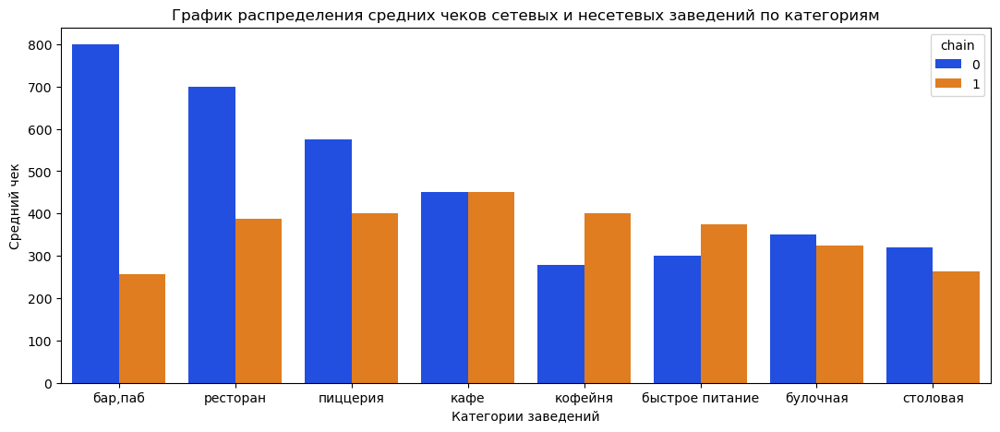

In [66]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=rating_min, x='category', y='middle_avg_bill', hue='chain', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения средних чеков сетевых и несетевых заведений по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Средний чек');

**Вывод:**

Заведения с плохим рейтингом (ниже 4.0) составляют почти 14% от общего числа мест общепита в Москве. Наибольший средний чек у баров/пабов, также высокий показатель у ресторанов и пиццерий, для всех характерно то, что в сетевых заведениях средний чек ниже, кроме кафе, кофеен и категории быстрого питания, для них обратная ситуация.

**Вывод по разделу:** В данном разделе мы проанализировали:

1. Распределение заведений по категориям.
2. Количество посадочных мест в местах по категориям.
3. Соотношение сетевых и несетевых заведений.
4. Какие категории заведений чаще являются сетевыми.
5. Топ-15 популярных сетей в Москве.
6. Распределение заведений по административным районам Москвы.
7. Распределение средних рейтингов по категориям заведений.
8. Средний рейтинг заведений каждого района.
9. Карта заведений Москвы.
10. Топ-15 улиц по количеству заведений.
11. Улицы с одним объектом общепита.
12. Влияние удалённости от центра на цены в заведениях.
13. Зависимость часов работы заведений от их расположения и категории заведения.
14. Особенности заведений с плохими рейтингами.

И выяснили, что: 

- Самые распространенны заведения в Москве - это кафе, а также большое количество ресторанов и кофеен. Меньше всего - столовых и булочных.

- Наибольшее количество посадочных мест представлены в ресторанах, барах/пабах и кофейнях. Меньше всего - в пиццериях и булочных. Скорее всего, это обусловлено тем, что в последних упомянутых заведелениях часто берут еду на вынос.

- Количество несетевых заведений примерно в полтора раза больше, чем сетевых.

- Сетевыми заведениями чаще являются такие категории, как кофейни, пиццерии, булочные, хотя соотношение количества между сетевыми и несетевыми у них примерно одинаковое. Для остальных же категорий преобладают несетевые.

- Выявили топ-15 популярных сетевых заведений, самой распространенной является Шоколадница, она лидирует с большим отрывом. Из этих заведений больше распространены такие категории, как кафе и кофейни.

- Наибольшее количество заведений расположено в Центральном административном округе, в котором преобладают рестораны, а также кафе и кафейни, чуть меньше бары/пабы. В остальных округах распространены кафе и в меньшей степени рестораны.

- Усреднённые рейтинги в разных типах общепита не сильно различаются. Значения находятся в диапозоне от 4 до 4.4. Наибольший рейтинг у баров/пабов, наименьший - быстрое питание и кафе.

- Наибольший рейтинг у заведений Центрального административного округа, у остальных округов медианный рейтинг одинаковый, наименьший - у Северо-Восточного административного округа и Юго-Восточного административного округа.

- Количество заведений при удалении от центра уменьшается.

- Выявили топ-15 улиц по количеству заведений, самой популярной является проспект Мира, где сосредоточены 2.19% от общего числа общепита и преобладают кафе, а также рестораны и кафейни, на остальных улицах популярными категориями заведений являются кафе и рестораны, пропорции которых немного варьируются.

- Количество улиц с одним объектом общепита - 458. Большинство заведений представлены в категориях кафе, ресторан и кофейни, также преобладают несетевые заведения. В основном, рейтинг заведений распределены от 4.0 до 4.7.

- Выявили зависимость средних чеков заведений от удаленности от центра Москвы. Чем дальше от центра, тем ниже значения среднего чека. Наибольший средний чек в Центральном и Западном административных округах, наименьший - у Северо-Восточного, Южного и Юго-Восточного административных округов.

- Больше всего ежедневных круглосуточных заведений расположено в Центральном административном округе, где преобладают категории кафе, баров/пабов, ресторанов и кофейни. Также большое количество таких мест находятся в Юго-Восточном и Восточном административных округах, большинство кафе, в последнем еще распространены рестораны.

- Заведения с плохим рейтингом (ниже 4.0) составляют почти 14% от общего числа мест общепита в Москве. Наибольший средний чек у баров/пабов, также высокий показатель у ресторанов и пиццерий, для всех характерно то, что в сетевых заведениях средний чек ниже, кроме кафе, кофеен и категории быстрого питания, для них обратная ситуация.

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

### Количество кофеен по районам 
<a id="20-bullet"></a>

Для начала найдем общее количество кофеен в данных. Создадим новый датафрейм, где оставим только нужную категорию заведений.

In [67]:
data_cof = data.query('category == "кофейня"')

#выведем кол-во кофеен
data_cof.shape[0]

1413

Выясним как распределены кофейни по районам

In [68]:
#сгруппируем датафрейм по округам

data_coffe = data_cof.groupby('district', as_index=False)[['name']].count().\
sort_values('name', ascending=False)

data_coffe

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [69]:
#Дополнительно найдем какой процент составляет количество заведений в округах от общего количества 
data_coffe['perc'] = round(data_coffe['name'] / data_cof.shape[0] * 100, 2)

data_coffe

,district,name,perc
5,Центральный административный округ,428,30.29
2,Северный административный округ,193,13.66
3,Северо-Восточный административный округ,159,11.25
1,Западный административный округ,150,10.62
8,Южный административный округ,131,9.27
0,Восточный административный округ,105,7.43
7,Юго-Западный административный округ,96,6.79
6,Юго-Восточный административный округ,89,6.30
4,Северо-Западный административный округ,62,4.39


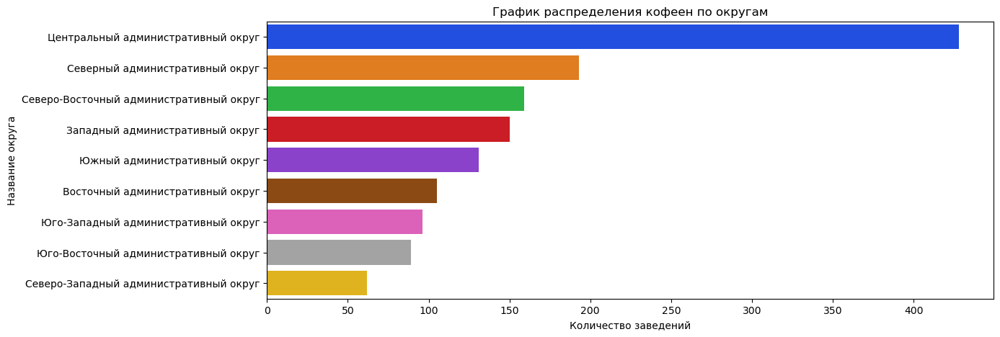

In [70]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_coffe, y='district', x='name', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения кофеен по округам')
plt.xlabel('Количество заведений')
plt.ylabel('Название округа');

Также визуализируем кофейни на карте Москвы

In [71]:
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(msc)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cof.apply(create_clusters, axis=1)

# выводим карту
msc

Дополнительно рассмотрим топ-15 самых популярных улиц расположений кофеен

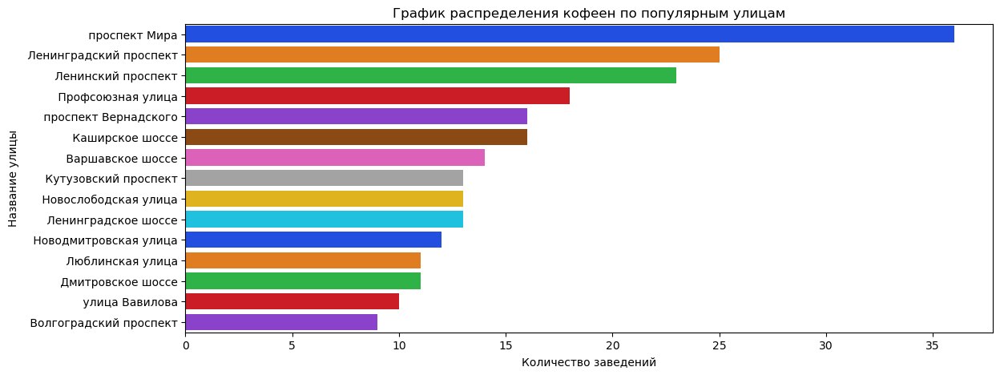

In [72]:
data_coffe_s = data_cof.groupby('street', as_index=False)[['name']].count().\
sort_values('name', ascending=False).head(15)

# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=data_coffe_s, y='street', x='name', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения кофеен по популярным улицам')
plt.xlabel('Количество заведений')
plt.ylabel('Название улицы');

Найдем улицы, на которых расположена только одна кофейня

In [73]:
street_df = data_cof.groupby('street', as_index=False)[['name']].count().\
sort_values('name', ascending=False).query('name == 1')

street_df

,street,name
395,Таможенный проезд,1
627,улица Яблочкова,1
449,ландшафтный заказник Лианозовский,1
397,Ташкентская улица,1
444,Ясногорская улица,1
...,...,...
250,Мишина улица,1
248,Михневская улица,1
247,Михалковская улица,1
246,Миусская площадь,1


In [74]:
#Для начала сформируем датафрейм из названий и их категорий

data_categ = data.query('category =="кофейня"')[['street', 'district']]

#Объединим датафрейм с попурялными сетями заведений и датафреймом с категориями, используем метод merge()

df_categoryy = street_df.merge(data_categ)
df_categoryy

,street,name,district
0,Таможенный проезд,1,Юго-Восточный административный округ
1,улица Яблочкова,1,Северо-Восточный административный округ
2,ландшафтный заказник Лианозовский,1,Северо-Восточный административный округ
3,Ташкентская улица,1,Юго-Восточный административный округ
4,Ясногорская улица,1,Юго-Западный административный округ
...,...,...,...
366,Мишина улица,1,Северный административный округ
367,Михневская улица,1,Южный административный округ
368,Михалковская улица,1,Северный административный округ
369,Миусская площадь,1,Центральный административный округ


In [75]:
df_categoryy.groupby('district')[['name']].count().\
sort_values('name', ascending=False)

,name
district,
Центральный административный округ,117
Северный административный округ,47
Восточный административный округ,39
Северо-Восточный административный округ,38
Южный административный округ,30
Юго-Восточный административный округ,28
Западный административный округ,27
Юго-Западный административный округ,23
Северо-Западный административный округ,22


**Вывод:**

В наших данных всего 1413 кофеен, наибольшее количество которых расположено в Центральном административном округе, процент от общего числа - 30.29%. Наименьшее - Северо-Западный административный округ (4.39%). Также рассмотрели расположение по улицам, большинство заведений находятся на проспекте Мира, также популярными по месторасположению являются Ленинградский проспект и Ленинский проспект. Присутствуют улицы, на которых расположены по одной кофейне, их количество - 317.

### Круглосуточные кофейни
<a id="21-bullet"></a>

Изучим есть ли круглосуточные кофейни 

In [76]:
cof_is = data_cof.groupby('is_24/7', as_index=False)[['name']].count()
cof_is

,is_24/7,name
0,0,1354
1,1,59


In [77]:
#Дополнительно найдем процент
cof_is['perc'] = round(cof_is['name'] / data_cof.shape[0] * 100, 2)

cof_is

,is_24/7,name,perc
0,0,1354,95.82
1,1,59,4.18


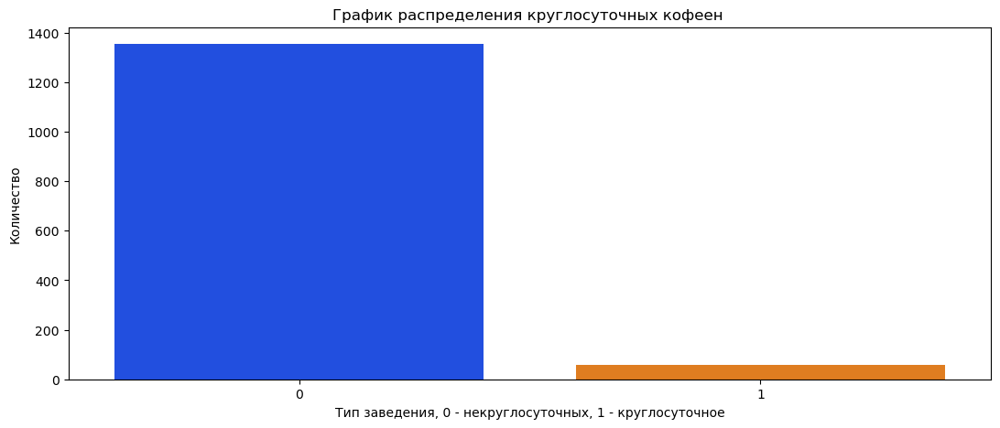

In [78]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=cof_is, x='is_24/7', y='name', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения круглосуточных кофеен ')
plt.xlabel('Тип заведения, 0 - некруглосуточных, 1 - круглосуточное')
plt.ylabel('Количество');

**Вывод:**

В Москве большинство круглосуточных кофеен, которые составляют почти 96% от общего числа кофеен.

### Распределение рейтингов кофеен по районам
<a id="22-bullet"></a>

Выясним какие средние рейтинги у кофеен и как они распределяются по районам

In [79]:
cof_rt = data_cof.groupby('district', as_index=False)[['rating']].median()\
.sort_values('rating', ascending=False)

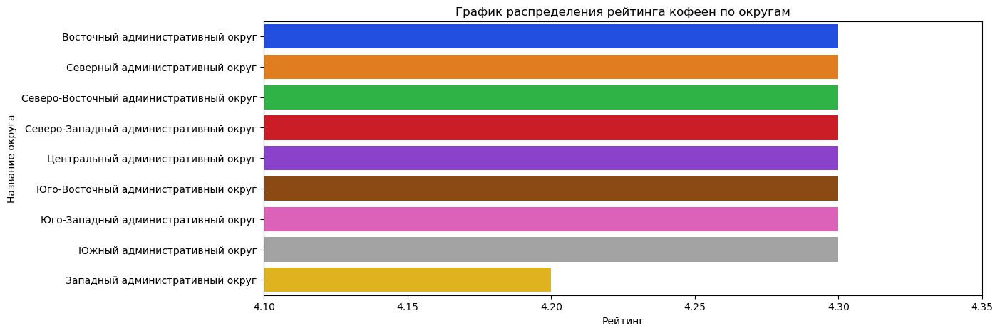

In [80]:
# назначаем размер графика
plt.figure(figsize=(13, 5))

# строим столбчатый график средствами seaborn
sns.barplot(data=cof_rt, y='district', x='rating', palette='bright')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения рейтинга кофеен по округам')
plt.xlabel('Рейтинг')
plt.ylabel('Название округа')
# задаем пределы по оси Y для наглядности
plt.xlim(4.1, 4.35);

**Вывод:**

Средние рейтинги у кофеен по всем округам одинаковые и равны 4.3, кроме Западного админимтративного округа (4.2).

### Стоимость чашки капучино
<a id="23-bullet"></a>

Выясним на какую стоимость чашки капучино стоит ориентироваться при открытии, для этого сначала исследуем значение столбца `middle_coffee_cup`

In [81]:
#Воспользуемся методом describe() для создания описательной статистики 
data_cof['middle_coffee_cup'].describe().T

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Как мы видим медианное значение стоимости чашки капучино равно 170 рублей. Основная часть данных расположилась в диапозоне от 124 до 225 рублей.

Далее проанализируем, как стоимость чашки капучино варьируется по округам Москвы.

In [82]:
cof_middle = data_cof.groupby('district', as_index=False)[['middle_coffee_cup']].median()\
.sort_values('middle_coffee_cup', ascending=False)

cof_middle

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [83]:
# создаём карту Москвы
ms = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cof_middle,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино по районам, руб',
).add_to(ms)

# выводим карту
ms

Самая высокая стоимость у Центрального, Западного и Юго-Западного административных округов, средний диапозон значений которой - от 198 до 189 рублей. Наименьшая - у Восточного (135 рублей).

**Вывод:**

При установлении стоимости чашки капучино при открытии нужно учитывать месторасположение будущего заведения. В среднем диапазон цен от 124 до 225 рублей. Самое частое значение 170 рублей. Если мы хотим привлечь покупателей от конкурентов, изначально можно поставить стоимость немного ниже, чем у заведений по району, но чтобы это окупалось. То есть, например для Западного административного округа, где медианная стоимость равна 189 рублей, вполне подойдет цена 150-170 рублей.

Далее проанализируем, как количество посадочных мест варьируются по округам Москвы. В столбце `seats` есть пропуски, скорее всего пропуски в данном случае обозначают, что посадочных мест нет в заведении, поэтому заменим их на 0.

In [84]:
#Воспользуемся методом fillna()
data_cof['seats'] = data_cof['seats'].fillna(0)

In [85]:
cof_seats = data_cof.groupby('district', as_index=False)[['seats']].median()\
.sort_values('seats', ascending=False)

cof_seats

,district,seats
1,Западный административный округ,48.5
7,Юго-Западный административный округ,20.0
2,Северный административный округ,12.0
3,Северо-Восточный административный округ,8.0
8,Южный административный округ,6.0
5,Центральный административный округ,4.0
4,Северо-Западный административный округ,3.5
0,Восточный административный округ,0.0
6,Юго-Восточный административный округ,0.0


In [86]:
# создаём карту Москвы
mo = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cof_seats,
    columns=['district', 'seats'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианное количество посадочных мест в заведениях по районам',
).add_to(mo)

# выводим карту
mo

**Вывод:**

Наибольшее количество посадочных мест у Западного и Юго-Западного административных округов, в остальных значение минимальное - от 0 до 8. Люди часто берут кофе на вынос.

## Общий вывод

### Вывод

<a id="24-bullet"></a>

**Рекомендация для открытия новой кофейни:**

- **Геолокация** 

Так как центр Москвы переполнен, и люди чаще предпочитают заведения с уровневнем доверия, то есть сетевые, наша кофейня к ним не относится, поэтому месторасположение заведения лучше выбрать из тех округов, в которых количество кофеен наименьшее, а именно: 
    
*Юго-Западный административный округ*	
    
*Юго-Восточный административный округ*	
    
*Северо-Западный административный округ*

Дополнительно стоит рассмотреть Западный админимтративный округ, так как только в нем рейтинг отличается от остальных районов, у него он самый низкий. Если открыть кофейню в этом месте и зарекомендовать себя, то покупателей можно привлечь посетителей.

Также необходимо учитывать близость к метро, бизнесс-центрам и торговым центрам, а также выяснить проходимость места.

- **График работы**

Востребованным является круглосуточный режим работы

- **Посадочные места**

Количество посадочных мест можно установить в диапазоне от 0 до 8, так как это наиболее восстребованный формат, большинство посетителей берет кофе на вынос.

- **Стоимость чашки капучино**

При установлении стоимости чашки капучино необходимо учитывать месторасположение будущего заведения. Если мы хотим привлечь покупателей от конкурентов, изначально можно поставить стоимость немного ниже, чем у заведений по району, но чтобы это окупалось. Так, для рассматриваемых округов можно выбрать следующие стоимости чашки капучино:

*Юго-Западный административный округ - 180 рублей*	
    
*Юго-Восточный административный округ - 130 рублей*	
    
*Северо-Западный административный - округ 150 рублей*

*Западный административный округ - 170 рублей*